In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import accuracy_score, confusion_matrix,roc_curve,roc_auc_score
from scipy.stats import zscore
from sklearn.preprocessing import StandardScaler
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error,mean_absolute_error
from sklearn.linear_model import Ridge,Lasso,RidgeCV,LassoCV
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import PowerTransformer
from scipy.stats import skew
from sklearn.feature_selection import SelectPercentile
from sklearn.feature_selection import chi2

In [2]:
df=pd.read_csv(r"https://raw.githubusercontent.com/dsrscientist/Data-Science-ML-Capstone-Projects/master/Automobile_insurance_fraud.csv")
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


In [3]:
df.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In [5]:
df.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

In [6]:
df["policy_state"].unique()

array(['OH', 'IN', 'IL'], dtype=object)

In [7]:
df=df.drop(["_c39","insured_hobbies","insured_relationship","auto_make"],axis=1)

In [8]:
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_model,auto_year,fraud_reported
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,1,2,YES,71610,6510,13020,52080,92x,2004,Y
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,0,0,?,5070,780,780,3510,E400,2007,Y
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,2,3,NO,34650,7700,3850,23100,RAM,2007,N
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,1,2,NO,63400,6340,6340,50720,Tahoe,2014,Y
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,0,1,NO,6500,1300,650,4550,RSX,2009,N


In [9]:
df.info()   

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 36 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  capital-gains      

In [10]:
df.describe()

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,546238.648000,1136.000000,1256.406150,1.101000e+06,501214.488000,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000
std,115.113174,9.140287,257063.005276,611.864673,244.167395,2.297407e+06,71701.610941,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861
min,0.000000,19.000000,100804.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000
25%,115.750000,32.000000,335980.250000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000
50%,199.500000,38.000000,533135.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000
75%,276.250000,44.000000,759099.750000,2000.000000,1415.695000,0.000000e+00,603251.000000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000
max,479.000000,64.000000,999435.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000


In [11]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
Label = ["fraud_reported","auto_model","police_report_available","property_damage","incident_location","incident_city","incident_state","authorities_contacted","incident_severity","collision_type","incident_type","incident_date","insured_occupation","insured_education_level","policy_csl","policy_state","policy_bind_date","insured_sex"]

for i in Label:
    df[i] = le.fit_transform(df[i])

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 36 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   int32  
 4   policy_state                 1000 non-null   int32  
 5   policy_csl                   1000 non-null   int32  
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   int32  
 11  insured_education_level      1000 non-null   int32  
 12  insured_occupation           1000 non-null   int32  
 13  capital-gains      

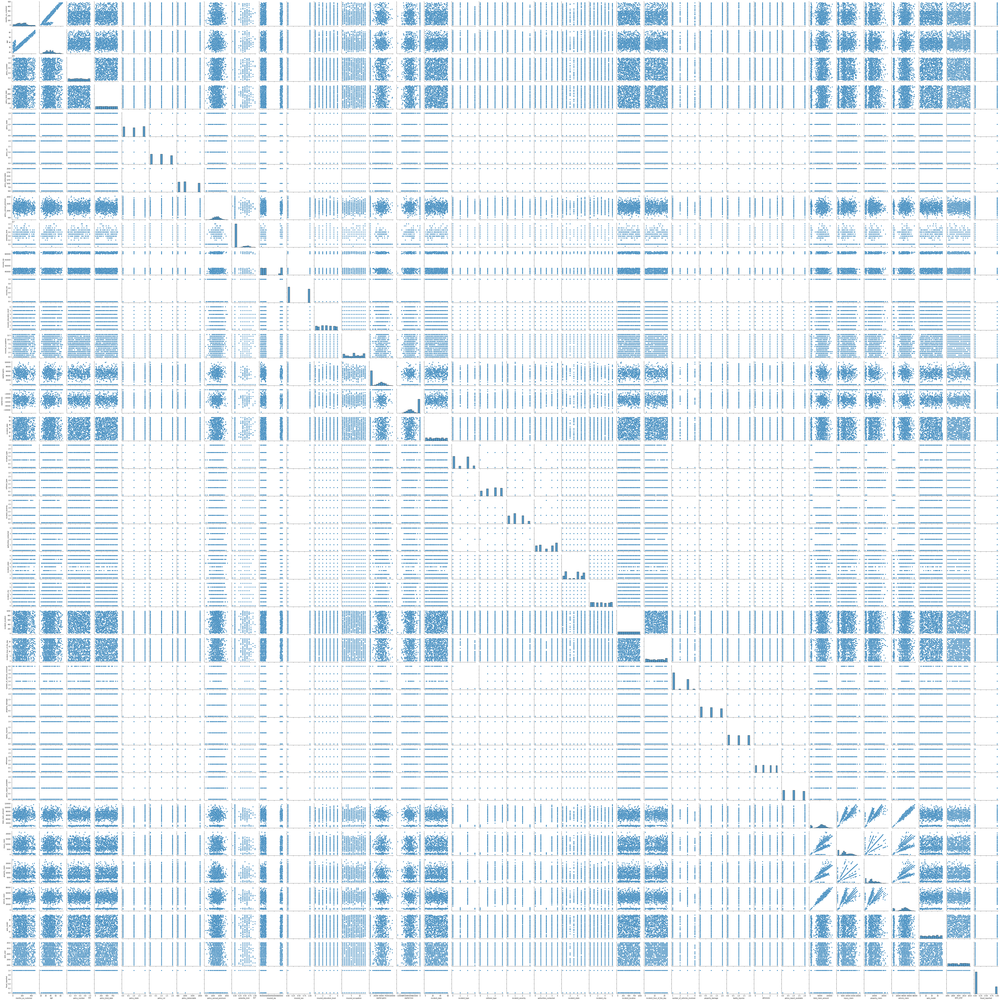

In [13]:
sns.pairplot(df)

months_as_customer               AxesSubplot(0.125,0.787927;0.0945122x0.0920732)
age                            AxesSubplot(0.238415,0.787927;0.0945122x0.0920...
policy_number                  AxesSubplot(0.351829,0.787927;0.0945122x0.0920...
policy_bind_date               AxesSubplot(0.465244,0.787927;0.0945122x0.0920...
policy_state                   AxesSubplot(0.578659,0.787927;0.0945122x0.0920...
policy_csl                     AxesSubplot(0.692073,0.787927;0.0945122x0.0920...
policy_deductable              AxesSubplot(0.805488,0.787927;0.0945122x0.0920...
policy_annual_premium            AxesSubplot(0.125,0.677439;0.0945122x0.0920732)
umbrella_limit                 AxesSubplot(0.238415,0.677439;0.0945122x0.0920...
insured_zip                    AxesSubplot(0.351829,0.677439;0.0945122x0.0920...
insured_sex                    AxesSubplot(0.465244,0.677439;0.0945122x0.0920...
insured_education_level        AxesSubplot(0.578659,0.677439;0.0945122x0.0920...
insured_occupation          

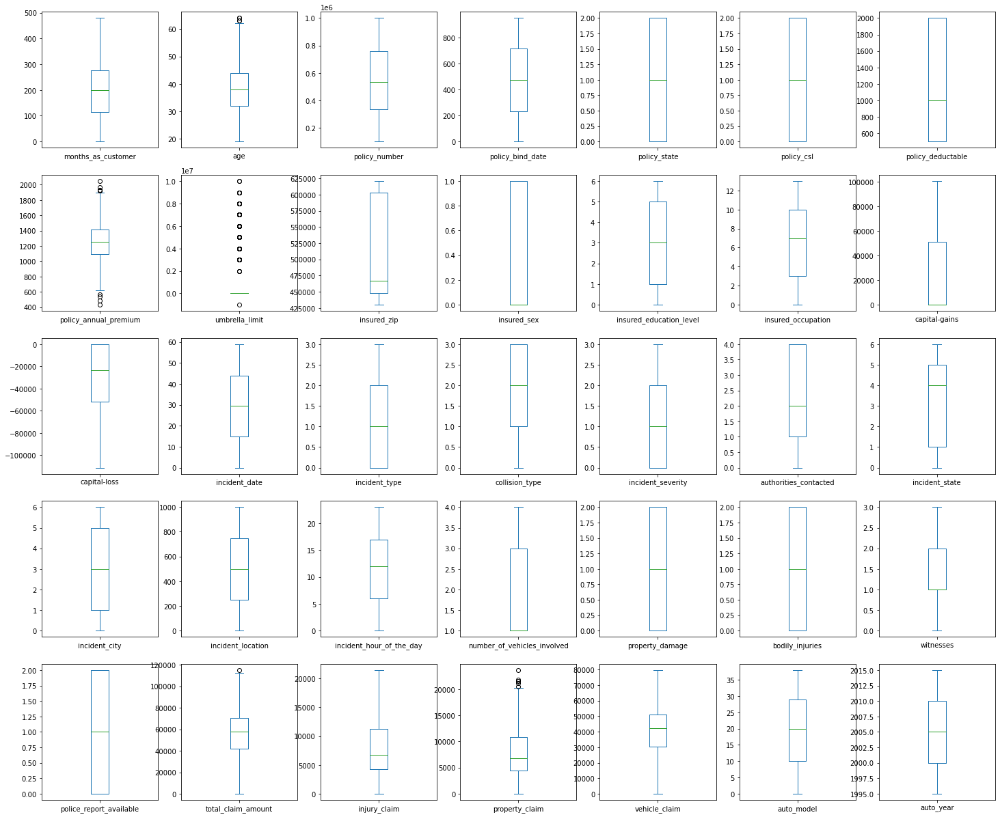

In [14]:
df.drop(["fraud_reported"],axis=1).plot(kind='box',subplots=True,layout=(7,7),figsize=(25,30))

In [15]:
X=df.drop(["fraud_reported"],axis=1)
Y=df.fraud_reported

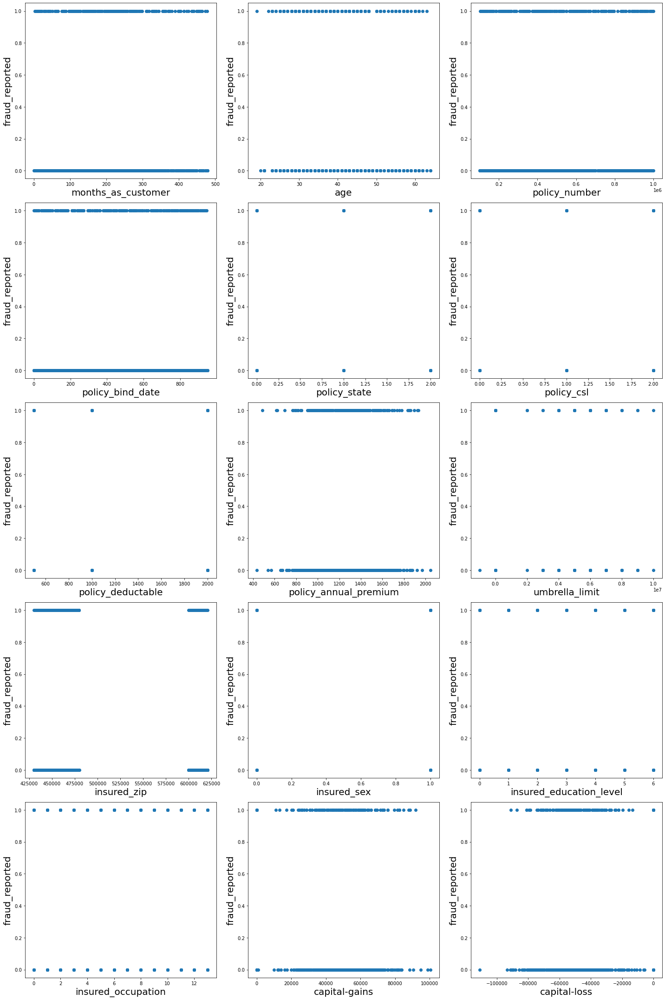

In [16]:
plt.figure(figsize=(20,30))
pltnumber=1

for column in X:
    if pltnumber<=15:
        ax=plt.subplot(5,3,pltnumber)
        plt.scatter(X[column],Y)
        plt.xlabel(column,fontsize=20)
        plt.ylabel('fraud_reported',fontsize=20)
    pltnumber+=1
plt.tight_layout()

0.36163335598724383
0.478269265444348
0.03893213182582571
0.005186202844270977
-0.026137504198744846
0.08879442824718038
0.47717008402692257
0.004395388781646907
1.804001000430236
0.8153285842913767
0.1484068958860874
-0.00014764583772972734
-0.05879282395976636
0.4781316547453607
-0.3908844902380315
0.00474930235009113
0.1013547038173225
-0.19305483483225155
0.27859761575126224
-0.12156174315320889
-0.14864196325391382
0.04945631534093415
0.0
-0.03553106748270712
0.5019097769712054
0.10625836602112458
0.014754928613816467
0.019606952945384615
0.052887207978431584
-0.593689743653387
0.2644134965313636
0.37760128674511556
-0.6201658958678784
-0.08065133467296177
-0.04821634370155536
1.1732877926115954


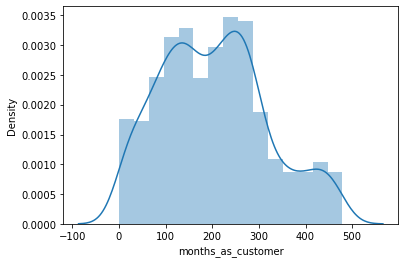

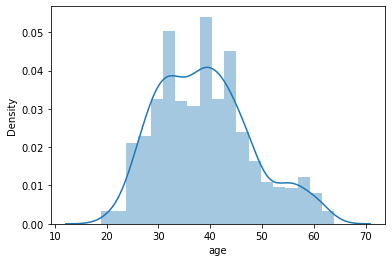

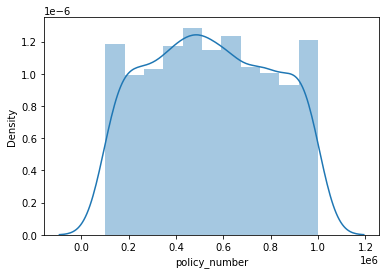

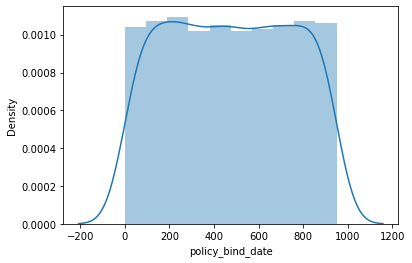

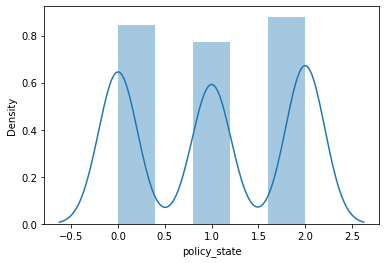

...

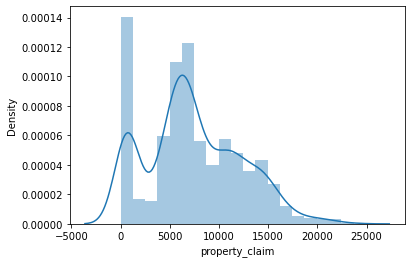

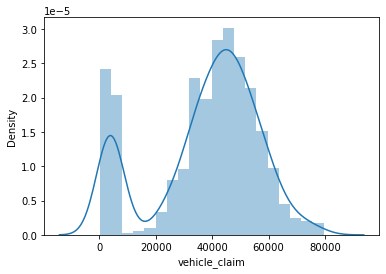

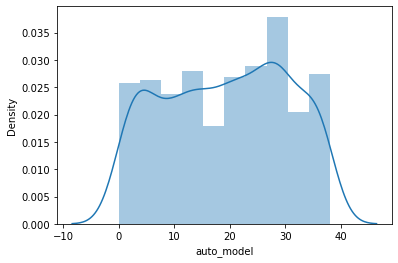

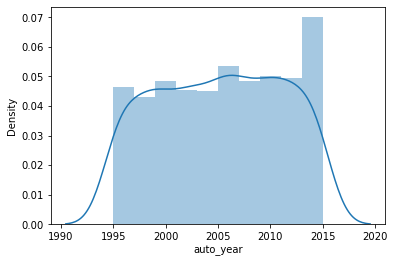

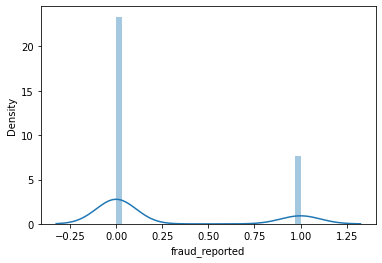

In [17]:
for col in df:
    print(skew(df[col]))
    plt.figure()
    sns.distplot(df[col])
    plt.show

In [18]:
df.skew()

months_as_customer             0.362177
age                            0.478988
policy_number                  0.038991
policy_bind_date               0.005194
policy_state                  -0.026177
policy_csl                     0.088928
policy_deductable              0.477887
policy_annual_premium          0.004402
umbrella_limit                 1.806712
insured_zip                    0.816554
insured_sex                    0.148630
insured_education_level       -0.000148
insured_occupation            -0.058881
capital-gains                  0.478850
capital-loss                  -0.391472
incident_date                  0.004756
incident_type                  0.101507
collision_type                -0.193345
incident_severity              0.279016
authorities_contacted         -0.121744
incident_state                -0.148865
incident_city                  0.049531
incident_location              0.000000
incident_hour_of_the_day      -0.035584
number_of_vehicles_involved    0.502664


In [19]:
X=df.drop(columns="fraud_reported")
Y=df["fraud_reported"] 

In [20]:
df_corr=df.corr().abs()
df_corr

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_model,auto_year,fraud_reported
months_as_customer,1.000000,0.922098,0.057555,0.055055,0.000328,0.026819,0.026807,0.005018,0.015498,0.017895,...,0.010162,0.058383,0.017647,0.062108,0.065329,0.034940,0.061013,0.004202,0.000292,0.020544
age,0.922098,1.000000,0.059413,0.056538,0.014533,0.015185,0.029188,0.014404,0.018126,0.025604,...,0.015679,0.052359,0.014661,0.069863,0.075522,0.060898,0.062588,0.017343,0.001354,0.012143
policy_number,0.057555,0.059413,1.000000,0.045713,0.072815,0.038917,0.006738,0.022566,0.008968,0.007083,...,0.004558,0.012661,0.032019,0.018009,0.008762,0.010678,0.020184,0.065240,0.000183,0.029443
policy_bind_date,0.055055,0.056538,0.045713,1.000000,0.015289,0.008486,0.001721,0.037733,0.024866,0.042749,...,0.046970,0.007004,0.034920,0.015901,0.024160,0.008611,0.013784,0.000306,0.035067,0.060642
policy_state,0.000328,0.014533,0.072815,0.015289,1.000000,0.001027,0.010033,0.012455,0.029580,0.008777,...,0.013384,0.022960,0.071950,0.006002,0.046290,0.008406,0.001425,0.025253,0.002114,0.029432
policy_csl,0.026819,0.015185,0.038917,0.008486,0.001027,1.000000,0.003384,0.023978,0.021636,0.006879,...,0.000595,0.071500,0.002424,0.055758,0.078818,0.042216,0.046791,0.047885,0.033082,0.037190
policy_deductable,0.026807,0.029188,0.006738,0.001721,0.010033,0.003384,1.000000,0.003245,0.010870,0.004545,...,0.022765,0.066639,0.030166,0.022839,0.039107,0.064792,0.005269,0.003268,0.026105,0.014817
policy_annual_premium,0.005018,0.014404,0.022566,0.037733,0.012455,0.023978,0.003245,1.000000,0.006247,0.032354,...,0.026780,0.002332,0.013624,0.009094,0.017633,0.011654,0.020246,0.031849,0.049226,0.014480
umbrella_limit,0.015498,0.018126,0.008968,0.024866,0.029580,0.021636,0.010870,0.006247,1.000000,0.019671,...,0.022743,0.006738,0.055951,0.040344,0.045412,0.023790,0.038584,0.040256,0.009893,0.058622
insured_zip,0.017895,0.025604,0.007083,0.042749,0.008777,0.006879,0.004545,0.032354,0.019671,1.000000,...,0.028695,0.019805,0.017607,0.033873,0.017495,0.006841,0.041083,0.023637,0.032736,0.019368


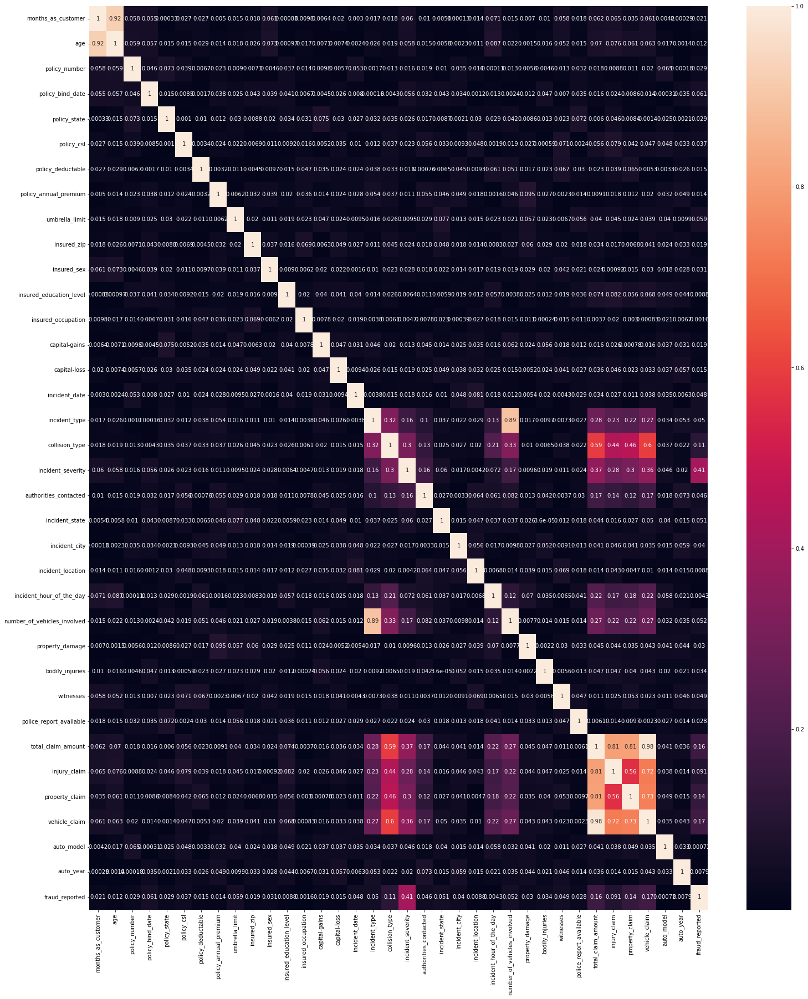

In [21]:
plt.figure(figsize=(25,30))
sns.heatmap(df_corr,annot=True)
plt.show()

In [22]:
X=df.drop(columns="fraud_reported")
Y=df["fraud_reported"]

In [23]:
scalar=StandardScaler()
X_scaled=scalar.fit_transform(X)

vif=pd.DataFrame()
vif["vif"]=[variance_inflation_factor(X_scaled,i) for i in range(X_scaled.shape[1])]
vif["Features"]=X.columns

vif

,vif,Features
0,6.807528,months_as_customer
1,6.844901,age
2,1.028120,policy_number
3,1.026231,policy_bind_date
4,1.036256,policy_state
5,1.030443,policy_csl
6,1.035059,policy_deductable
7,1.041030,policy_annual_premium
8,1.025727,umbrella_limit
9,1.034113,insured_zip


In [24]:
df=df.drop(["total_claim_amount","injury_claim","property_claim","vehicle_claim"],axis=1)

In [25]:
X=df.drop(columns="fraud_reported")
Y=df["fraud_reported"]

In [26]:
scalar=StandardScaler()
X_scaled=scalar.fit_transform(X)

vif=pd.DataFrame()
vif["vif"]=[variance_inflation_factor(X_scaled,i) for i in range(X_scaled.shape[1])]
vif["Features"]=X.columns

vif

,vif,Features
0,6.746292,months_as_customer
1,6.780935,age
2,1.027536,policy_number
3,1.026065,policy_bind_date
4,1.030360,policy_state
5,1.024503,policy_csl
6,1.024956,policy_deductable
7,1.036356,policy_annual_premium
8,1.024013,umbrella_limit
9,1.031046,insured_zip


# USING KNN

In [27]:
from sklearn.neighbors import KNeighborsClassifier
import warnings
warnings.filterwarnings("ignore")

In [28]:
X=df.drop(columns="fraud_reported")
Y=df["fraud_reported"]

In [29]:
scaler=StandardScaler()
X_scaled=scaler.fit_transform(X)


X_train,X_test,Y_train,Y_test=train_test_split(X_scaled,Y,test_size=0.25,random_state=21)
knn=KNeighborsClassifier()
knn.fit(X_train,Y_train)

KNeighborsClassifier()

In [30]:
Y_pred=knn.predict(X_test)

In [31]:
cfm=confusion_matrix(Y_test,Y_pred)
cfm

array([[166,  10],
       [ 63,  11]], dtype=int64)

In [32]:
accuracy=accuracy_score(Y_test,Y_pred)
accuracy

0.708

In [33]:
auc=roc_auc_score(Y_test,Y_pred)
auc

0.5459152334152335

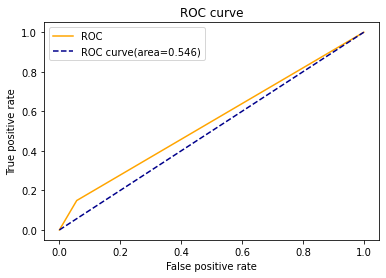

In [34]:
fpr,tpr,thresholds=roc_curve(Y_test,Y_pred)

plt.plot(fpr,tpr,color='orange',label='ROC')
plt.plot([0,1],[0,1],color='darkblue',linestyle='--',label='ROC curve(area=%0.3f)'%auc)
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend()
plt.show()

In [35]:
from sklearn.metrics import classification_report
print(classification_report(Y_test,Y_pred))

              precision    recall  f1-score   support

           0       0.72      0.94      0.82       176
           1       0.52      0.15      0.23        74

    accuracy                           0.71       250
   macro avg       0.62      0.55      0.53       250
weighted avg       0.67      0.71      0.65       250



# USING KNN WITH HYPERPARAMETER TUNING

In [36]:
scaler=StandardScaler()

In [37]:
X_scaled=scaler.fit_transform(X)
X_train,X_test,Y_train,Y_test=train_test_split(X_scaled,Y,test_size=0.25,random_state=21)
knn=KNeighborsClassifier()

In [38]:
param_grid=[
    {'algorithm':['kd_tree','brute','ball_tree'],
    'leaf_size':[15,18,20],
    'n_neighbors':[3,5,7,13]
    }
]

In [39]:
from sklearn.model_selection import GridSearchCV

In [40]:
clf=GridSearchCV(knn,param_grid,cv=3,n_jobs=-1,verbose=2)
clf.fit(X_train,Y_train)

Fitting 3 folds for each of 36 candidates, totalling 108 fits


GridSearchCV(cv=3, estimator=KNeighborsClassifier(), n_jobs=-1,
             param_grid=[{'algorithm': ['kd_tree', 'brute', 'ball_tree'],
                          'leaf_size': [15, 18, 20],
                          'n_neighbors': [3, 5, 7, 13]}],
             verbose=2)

In [41]:
clf.best_params_

{'algorithm': 'kd_tree', 'leaf_size': 15, 'n_neighbors': 13}

In [42]:
Y_pred=clf.predict(X_test)
Y_pred_train=clf.predict(X_train)

In [43]:
accuracy=accuracy_score(Y_test,Y_pred)
accuracy

0.72

In [44]:
cfm=confusion_matrix(Y_test,Y_pred)
cfm

array([[176,   0],
       [ 70,   4]], dtype=int64)

In [45]:
auc=roc_auc_score(Y_test,Y_pred)
auc

0.527027027027027

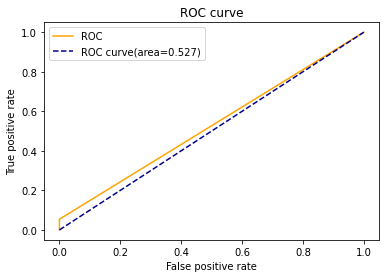

In [46]:
fpr,tpr,thresholds=roc_curve(Y_test,Y_pred)

plt.plot(fpr,tpr,color='orange',label='ROC')
plt.plot([0,1],[0,1],color='darkblue',linestyle='--',label='ROC curve(area=%0.3f)'%auc)
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend()
plt.show()

# RANDOM FOREST WITH HYPERPARAMETER (RANDOM AND GRID)

In [47]:
from sklearn.metrics import classification_report
print(classification_report(Y_test,Y_pred))

              precision    recall  f1-score   support

           0       0.72      1.00      0.83       176
           1       1.00      0.05      0.10        74

    accuracy                           0.72       250
   macro avg       0.86      0.53      0.47       250
weighted avg       0.80      0.72      0.62       250



In [48]:
from sklearn.model_selection import RandomizedSearchCV

In [49]:
X=df.drop(columns="fraud_reported")
Y=df["fraud_reported"]

In [50]:
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]

max_features = ['auto', 'sqrt','log2']

max_depth = [int(x) for x in np.linspace(10, 1000,10)]

min_samples_split = [2, 5, 10,14]

min_samples_leaf = [1, 2, 4,6,8]

random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
              'criterion':['entropy','gini']}
print(random_grid)

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'max_features': ['auto', 'sqrt', 'log2'], 'max_depth': [10, 120, 230, 340, 450, 560, 670, 780, 890, 1000], 'min_samples_split': [2, 5, 10, 14], 'min_samples_leaf': [1, 2, 4, 6, 8], 'criterion': ['entropy', 'gini']}


In [51]:
from sklearn.ensemble import RandomForestClassifier

In [52]:
rf=RandomForestClassifier()
rf_randomcv=RandomizedSearchCV(estimator=rf,param_distributions=random_grid,n_iter=100,cv=3,verbose=2,
                               random_state=100,n_jobs=-1)

rf_randomcv.fit(X_train,Y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'criterion': ['entropy', 'gini'],
                                        'max_depth': [10, 120, 230, 340, 450,
                                                      560, 670, 780, 890,
                                                      1000],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4, 6, 8],
                                        'min_samples_split': [2, 5, 10, 14],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000]},
                   random_state=100, verbose=2)

In [53]:
rf_randomcv.best_params_

{'n_estimators': 200,
 'min_samples_split': 2,
 'min_samples_leaf': 2,
 'max_features': 'sqrt',
 'max_depth': 1000,
 'criterion': 'entropy'}

In [54]:
best_random_grid=rf_randomcv.best_estimator_
best_random_grid

RandomForestClassifier(criterion='entropy', max_depth=1000, max_features='sqrt',
                       min_samples_leaf=2, n_estimators=200)

In [55]:
from sklearn.metrics import accuracy_score
Y_pred=best_random_grid.predict(X_test)
print(confusion_matrix(Y_test,Y_pred))
print("Accuracy Score {}".format(accuracy_score(Y_test,Y_pred)))
print("Classification report: {}".format(classification_report(Y_test,Y_pred)))

[[161  15]
 [ 51  23]]
Accuracy Score 0.736
Classification report:               precision    recall  f1-score   support

           0       0.76      0.91      0.83       176
           1       0.61      0.31      0.41        74

    accuracy                           0.74       250
   macro avg       0.68      0.61      0.62       250
weighted avg       0.71      0.74      0.71       250



# GRID SEARCH CV

In [56]:
rf_randomcv.best_params_

{'n_estimators': 200,
 'min_samples_split': 2,
 'min_samples_leaf': 2,
 'max_features': 'sqrt',
 'max_depth': 1000,
 'criterion': 'entropy'}

In [57]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'criterion': [rf_randomcv.best_params_['criterion']],
    'max_depth': [rf_randomcv.best_params_['max_depth']],
    'max_features': [rf_randomcv.best_params_['max_features']],
    'min_samples_leaf': [rf_randomcv.best_params_['min_samples_leaf'], 
                         rf_randomcv.best_params_['min_samples_leaf']+2, 
                         rf_randomcv.best_params_['min_samples_leaf'] + 4],
    'min_samples_split': [rf_randomcv.best_params_['min_samples_split'] - 2,
                          rf_randomcv.best_params_['min_samples_split'] - 1,
                          rf_randomcv.best_params_['min_samples_split'], 
                          rf_randomcv.best_params_['min_samples_split'] +1,
                          rf_randomcv.best_params_['min_samples_split'] + 2],
    'n_estimators': [rf_randomcv.best_params_['n_estimators'] - 200, rf_randomcv.best_params_['n_estimators'] - 100, 
                     rf_randomcv.best_params_['n_estimators'], 
                     rf_randomcv.best_params_['n_estimators'] + 100, rf_randomcv.best_params_['n_estimators'] + 200]
}

print(param_grid)

{'criterion': ['entropy'], 'max_depth': [1000], 'max_features': ['sqrt'], 'min_samples_leaf': [2, 4, 6], 'min_samples_split': [0, 1, 2, 3, 4], 'n_estimators': [0, 100, 200, 300, 400]}


In [58]:
rf=RandomForestClassifier()
grid_search=GridSearchCV(estimator=rf,param_grid=param_grid,cv=10,n_jobs=-1,verbose=2)
grid_search.fit(X_train,Y_train)

Fitting 10 folds for each of 75 candidates, totalling 750 fits


GridSearchCV(cv=10, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'criterion': ['entropy'], 'max_depth': [1000],
                         'max_features': ['sqrt'],
                         'min_samples_leaf': [2, 4, 6],
                         'min_samples_split': [0, 1, 2, 3, 4],
                         'n_estimators': [0, 100, 200, 300, 400]},
             verbose=2)

In [59]:
grid_search.best_estimator_

RandomForestClassifier(criterion='entropy', max_depth=1000, max_features='sqrt',
                       min_samples_leaf=2, min_samples_split=3,
                       n_estimators=400)

In [60]:
best_grid=grid_search.best_estimator_
best_grid

RandomForestClassifier(criterion='entropy', max_depth=1000, max_features='sqrt',
                       min_samples_leaf=2, min_samples_split=3,
                       n_estimators=400)

In [61]:
Y_pred=best_grid.predict(X_test)
print(confusion_matrix(Y_test,Y_pred))
print("Accuracy Score {}".format(accuracy_score(Y_test,Y_pred)))
print("Classification report: {}".format(classification_report(Y_test,Y_pred)))

[[166  10]
 [ 53  21]]
Accuracy Score 0.748
Classification report:               precision    recall  f1-score   support

           0       0.76      0.94      0.84       176
           1       0.68      0.28      0.40        74

    accuracy                           0.75       250
   macro avg       0.72      0.61      0.62       250
weighted avg       0.73      0.75      0.71       250



In [62]:
accuracy=accuracy_score(Y_test,Y_pred)
accuracy

0.748

In [63]:
auc=roc_auc_score(Y_test,Y_pred)
auc

0.613482800982801

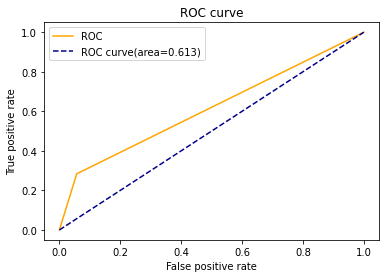

In [64]:
fpr,tpr,thresholds=roc_curve(Y_test,Y_pred)

plt.plot(fpr,tpr,color='orange',label='ROC')
plt.plot([0,1],[0,1],color='darkblue',linestyle='--',label='ROC curve(area=%0.3f)'%auc)
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend()
plt.show()

# DECISION TREE

In [65]:
from sklearn.tree import DecisionTreeClassifier

In [66]:
X=df.drop(columns="fraud_reported")
Y=df["fraud_reported"]

In [67]:
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.25,random_state=21)
dt=DecisionTreeClassifier()
dt.fit(X_train,Y_train)

DecisionTreeClassifier()

In [68]:
Y_pred=dt.predict(X_test)

accuracy=accuracy_score(Y_test,Y_pred)
accuracy

0.696

In [69]:
cfm=confusion_matrix(Y_test,Y_pred)
cfm

array([[137,  39],
       [ 37,  37]], dtype=int64)

In [70]:
auc=roc_auc_score(Y_test,Y_pred)
auc

0.6392045454545455

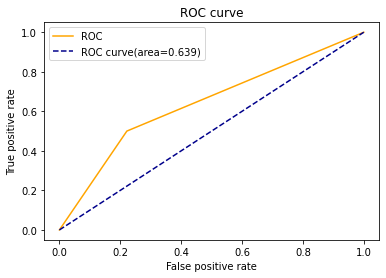

In [71]:
fpr,tpr,thresholds=roc_curve(Y_test,Y_pred)

plt.plot(fpr,tpr,color='orange',label='ROC')
plt.plot([0,1],[0,1],color='darkblue',linestyle='--',label='ROC curve(area=%0.3f)'%auc)
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend()
plt.show()

In [72]:
print(classification_report(Y_test,Y_pred))

              precision    recall  f1-score   support

           0       0.79      0.78      0.78       176
           1       0.49      0.50      0.49        74

    accuracy                           0.70       250
   macro avg       0.64      0.64      0.64       250
weighted avg       0.70      0.70      0.70       250



# DECISIONTREE WITH HYPER PARAMETER TUNING

In [73]:
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.25,random_state=21)
dt=DecisionTreeClassifier()

In [74]:
param_grid = {
               'max_depth': range(3,12,2),
               'min_samples_split': range(4,10,2),
               'min_samples_leaf': range(3,10,2),
              'criterion':['entropy','gini']}

In [75]:
clf=GridSearchCV(dt,param_grid,cv=5,n_jobs=-1)
clf.fit(X_train,Y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['entropy', 'gini'],
                         'max_depth': range(3, 12, 2),
                         'min_samples_leaf': range(3, 10, 2),
                         'min_samples_split': range(4, 10, 2)})

In [76]:
clf.best_params_

{'criterion': 'gini',
 'max_depth': 3,
 'min_samples_leaf': 7,
 'min_samples_split': 4}

In [77]:
Y_pred=clf.predict(X_test)
cfm=confusion_matrix(Y_test,Y_pred)
cfm

array([[148,  28],
       [ 25,  49]], dtype=int64)

In [78]:
accuracy=accuracy_score(Y_test,Y_pred)
accuracy

0.788

In [79]:
auc=roc_auc_score(Y_test,Y_pred)
auc

0.7515356265356267

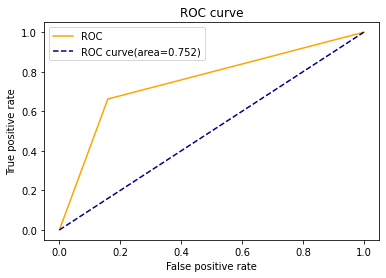

In [80]:
fpr,tpr,thresholds=roc_curve(Y_test,Y_pred)

plt.plot(fpr,tpr,color='orange',label='ROC')
plt.plot([0,1],[0,1],color='darkblue',linestyle='--',label='ROC curve(area=%0.3f)'%auc)
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend()
plt.show()

In [81]:
print(classification_report(Y_test,Y_pred))

              precision    recall  f1-score   support

           0       0.86      0.84      0.85       176
           1       0.64      0.66      0.65        74

    accuracy                           0.79       250
   macro avg       0.75      0.75      0.75       250
weighted avg       0.79      0.79      0.79       250



# GRADIENT BOOSTING

In [82]:
from sklearn.ensemble import GradientBoostingClassifier

In [83]:
X=df.drop(columns="fraud_reported")
Y=df["fraud_reported"]

In [84]:
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.25,random_state=21)

gbdt=GradientBoostingClassifier()
gbdt.fit(X_train,Y_train)

GradientBoostingClassifier()

In [85]:
Y_pred=gbdt.predict(X_test)

accuracy=accuracy_score(Y_test,Y_pred)
accuracy

0.748

In [86]:
cfm=confusion_matrix(Y_test,Y_pred)
cfm

array([[154,  22],
       [ 41,  33]], dtype=int64)

In [87]:
auc=roc_auc_score(Y_test,Y_pred)
auc

0.660472972972973

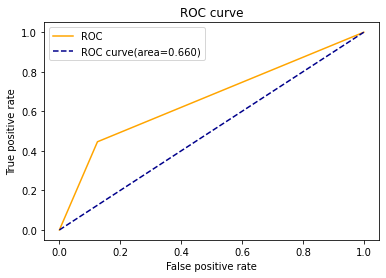

In [88]:
fpr,tpr,thresholds=roc_curve(Y_test,Y_pred)

plt.plot(fpr,tpr,color='orange',label='ROC')
plt.plot([0,1],[0,1],color='darkblue',linestyle='--',label='ROC curve(area=%0.3f)'%auc)
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend()
plt.show()

In [89]:
print(classification_report(Y_test,Y_pred))

              precision    recall  f1-score   support

           0       0.79      0.88      0.83       176
           1       0.60      0.45      0.51        74

    accuracy                           0.75       250
   macro avg       0.69      0.66      0.67       250
weighted avg       0.73      0.75      0.74       250



# GBDT WITH HYPER PARAMETER TUNING

In [90]:
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.25,random_state=21)

In [91]:
gbdt=GradientBoostingClassifier()

In [92]:
param_grid = {
               'max_depth': range(3,12,2),
               'min_samples_split': range(4,10,2),
               'min_samples_leaf': range(3,10,2),
              'learning_rate':np.arange(0.1,1,0.1)}

In [93]:
clf=GridSearchCV(gbdt,param_grid,cv=5,n_jobs=-1)
clf.fit(X_train,Y_train)

GridSearchCV(cv=5, estimator=GradientBoostingClassifier(), n_jobs=-1,
             param_grid={'learning_rate': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]),
                         'max_depth': range(3, 12, 2),
                         'min_samples_leaf': range(3, 10, 2),
                         'min_samples_split': range(4, 10, 2)})

In [94]:
clf.best_params_

{'learning_rate': 0.2,
 'max_depth': 9,
 'min_samples_leaf': 5,
 'min_samples_split': 6}

In [95]:
Y_pred=clf.predict(X_test)
accuracy=accuracy_score(Y_test,Y_pred)
accuracy

0.76

In [96]:
cfm=confusion_matrix(Y_test,Y_pred)
cfm

array([[154,  22],
       [ 38,  36]], dtype=int64)

In [97]:
auc=roc_auc_score(Y_test,Y_pred)
auc

0.6807432432432432

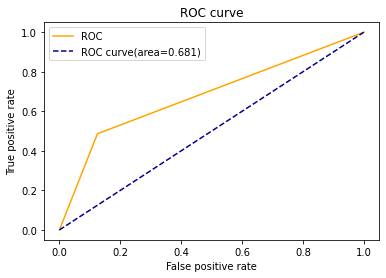

In [98]:
fpr,tpr,thresholds=roc_curve(Y_test,Y_pred)

plt.plot(fpr,tpr,color='orange',label='ROC')
plt.plot([0,1],[0,1],color='darkblue',linestyle='--',label='ROC curve(area=%0.3f)'%auc)
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend()
plt.show()

In [99]:
print(classification_report(Y_test,Y_pred))

              precision    recall  f1-score   support

           0       0.80      0.88      0.84       176
           1       0.62      0.49      0.55        74

    accuracy                           0.76       250
   macro avg       0.71      0.68      0.69       250
weighted avg       0.75      0.76      0.75       250



# Conclusion:

Conducted 4 models on Insurance Claim dataset namely KNN, Random Forest, Desicion Tree and Gradient Boosting with Hyperparameter tuning It comes to a conclusion that Desicion Tree model is providing best score for Insurance Claim dataset r2_score=0.788

In [100]:
md=[knn,rf,dt,gbdt]
import pickle
filename="Insurance Claim.pkl"
pickle.dump(md,open(filename,"wb"))